Pada google colab ini akan dipraktekan sebuah metode segmentasi yang dilanjutkan dengan menerapkan metode-metode morphological proses.

Raditya Nathaniel Nugroho
24/543188/PA/23069

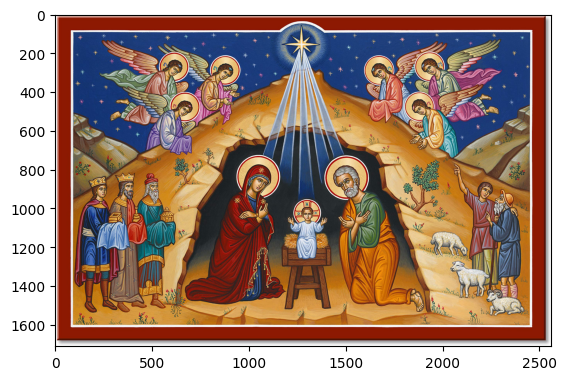

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import random
import math

image = cv2.imread('/content/91sknOyLQXL.jpg')

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image)
plt.show()

iterasi1perubahan total centroid = 120.1788
iterasi2perubahan total centroid = 12.790285
iterasi3perubahan total centroid = 4.9303436
iterasi4perubahan total centroid = 2.1636891
iterasi5perubahan total centroid = 1.0123194
iterasi6perubahan total centroid = 0.57675177
iterasi7perubahan total centroid = 0.3479529
iterasi8perubahan total centroid = 0.25562912
iterasi9perubahan total centroid = 0.12807176
iterasi10perubahan total centroid = 0.077365324
iterasi11perubahan total centroid = 0.06331558
iterasi12perubahan total centroid = 0.042085472
iterasi13perubahan total centroid = 0.024674892
iterasi14perubahan total centroid = 0.008710987
iterasi15perubahan total centroid = 0.001582247
iterasi16perubahan total centroid = 0.0016336958
iterasi17perubahan total centroid = 0.00012330222
iterasi18perubahan total centroid = 0.0
Konvergensi tercapai
Centroid akhir : 
Cluster 1: [151.16931   69.74984   26.889387]
Cluster 2: [42.57453 58.30178 87.04285]
Cluster 3: [210.80444 184.79855 150.0607 ]

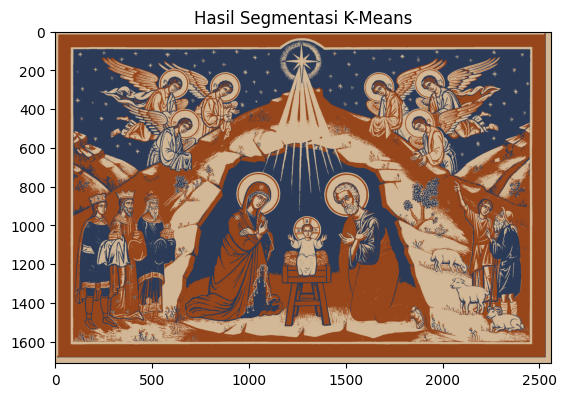

Gambar berhasil disimpan


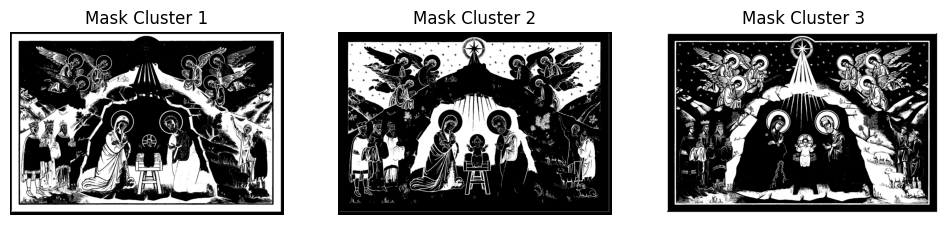

In [ ]:
#ubah image jadi 2d array

pixel_values = image.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

#terapkan k means clustering dan segmentasi gambarnya
k = 3
max_iter = 100
tolerance = 0.0001

#inisialisasi centroid awal secara acak

centroid = random.sample(list(pixel_values), k)

def euclidian_distance(x, y):
  return np.sqrt(np.sum((x - y) ** 2))

for iteration in range(max_iter):

  #assign tiap titik ke cluster terdekat
  cluster = [[] for _ in range(k)]
  for point in pixel_values:
    distances = [euclidian_distance(point, center) for center in centroid]
    cluster_index = np.argmin(distances)
    cluster[cluster_index].append(point)

  #simpan centroid lama untuk cek konvergensi
  centroid_lama = [np.copy(center) for center in centroid]

  #update centroid baru
  for i in range(k):
    if cluster[i]:
      centroid[i] = np.mean(cluster[i], axis = 0)

  #cek perubahan centroid
  diff = sum(euclidian_distance(centroid[i], centroid_lama[i]) for i in range(k))
  print("iterasi" + str(iteration + 1) + "perubahan total centroid = " + str(diff))

  if diff < tolerance:
    print("Konvergensi tercapai")
    break

#hasil akhir
print("Centroid akhir : ")
for i, center in enumerate(centroid):
  print("Cluster " + str(i + 1) + ": " + str(center))

print("Hasil pengelompokan")
for i, clust in enumerate(cluster):
  print("Cluster " + str(i + 1) + ": " + str(len(clust)))


labels = []
for point in pixel_values:
  distances = [euclidian_distance(point, center) for center in centroid]
  cluster_index = np.argmin(distances)
  labels.append(cluster_index)

labels = np.array(labels)

#segmentasi gambar
segmented_data = np.array([centroid[label] for label in labels])
segmented_image = segmented_data.reshape(image.shape).astype(np.uint8)

plt.imshow(segmented_image)
plt.title("Hasil Segmentasi K-Means")
plt.show()

cv2.imwrite("hasil_segmentasi.png", cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR))
print("Gambar berhasil disimpan")

#buat mask per cluster langsung dari label
h, w, c = image.shape
labels_2d = labels.reshape(h, w)
masks = []
for i in range(k):
  mask = np.where(labels_2d == i, 1, 0).astype(np.uint8)
  masks.append(mask)

#tampilkan setiap mask
fig, ax = plt.subplots(1, k, figsize=(12, 4))
for i in range(k):
  ax[i].imshow(masks[i], cmap='gray')
  ax[i].set_title("Mask Cluster " + str(i + 1))
  ax[i].axis('off')
plt.show()

for i, mask in enumerate(masks):
  filename = "mask_cluster_" + str(i + 1) + ".png"
  cv2.imwrite(filename, mask * 255)

In [ ]:
# #Load gambar hasil segmentasi
# segmented_image = cv2.imread("/content/hasil_segmentasi.png")
# segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB)

# plt.imshow(segmented_image)
# plt.show()

# #buat ke array 2d untuk memudahkan perbandingan
# h, w, c = segmented_image.shape
# pixels = segmented_image.reshape(-1,3)

# #tentukan centroid akhir hasil k means (nilainya diubah sesuai keperluan)
# centroid = np.array([
#   [180.76175, 178.54533, 171.48247],
#   [74.63181,  40.419975, 25.539124],
#   [123.59123,  118.010475, 107.62745 ]
# ])

# #tentukan cluster setiap piksel berdasarkan jarak ke centroid
# def euclidian_distance(x, y):
#   return np.sqrt(np.sum((x - y) ** 2))

# labels = []


memproses file mask_cluster_1.png
memproses file mask_cluster_2.png
memproses file mask_cluster_3.png
Threshold Otsu terpilih : 0


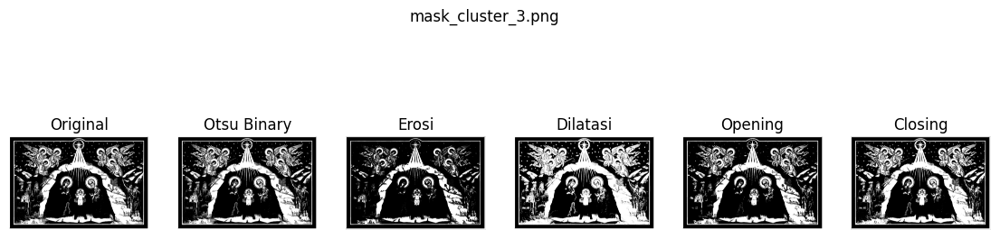

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob

#fungsi manual dari Otsu Thresholding
def otsu_threshold(img):
  hist, bins = np.histogram(img.flatten(), 256, [0, 256])
  total = img.size
  sum_total = np.dot(np.arange(256), hist)

  sumB = 0
  wB = 0
  max_var = 0
  threshold = 0

  for t in range(256):
    wB += hist[t]
    if wB == 0:
      continue
    wF = total - wB
    if wF == 0:
      break
    sumB += t * hist[t]
    mB = sumB / wB
    mF = (sum_total - sumB) / wF
    var_between = wB * wF * (mB - mF) ** 2
    if var_between > max_var :
      max_var = var_between
      threshold = t

  print("Threshold Otsu terpilih : " + str(threshold))
  return (img > threshold).astype(np.uint8)

#fungsi padding untuk image
def padding(img, pad) :
  return np.pad(img, pad, mode='constant', constant_values=0)

#implementasi operasi morfologi
def erosi(img, kernel) :
  k_center = (kernel.shape[0] // 2, kernel.shape[1] // 2)
  padded = padding(img, k_center)
  h, w = img.shape
  kh, kw = kernel.shape
  result = np.zeros_like(img)
  for i in range(h) :
    for j in range(w) :
      region = padded[i:i+kh, j:j+kw]
      if np.all(region[kernel == 1] == 1) :
        result[i, j] = 1
  return result

def dilatasi(img, kernel):
  k_center = (kernel.shape[0] // 2, kernel.shape[1] // 2)
  padded = padding(img, k_center)
  h, w = img.shape
  kh, kw = kernel.shape
  result = np.zeros_like(img)
  for i in range(h):
    for j in range(w):
      region = padded[i:i+kh, j:j+kw]
      if np.any(region[kernel == 1] == 1):
        result[i, j] = 1
  return result


def opening(img, kernel):
  eroded = erosi(img, kernel)
  opened = dilatasi(eroded, kernel)
  return opened

def closing(img, kernel):
  dilated = dilatasi(img, kernel)
  closed = erosi(dilated, kernel)
  return closed

#kernel
kernel = np.ones((3, 3), dtype=np.uint8)

#looping ke semua file mask
mask_files = sorted(glob.glob("mask_cluster_*.png"))

for mask_file in mask_files:
  #load mask
  print("memproses file " + mask_file)

  #baca mask dalam grayscale
  mask = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE)
  #Otsu threshold
  mask_bin = otsu_threshold(mask)

  #operasi morfologi
  eroded = erosi(mask_bin, kernel)
  dilated = dilatasi(mask_bin, kernel)
  opened = opening(mask_bin, kernel)
  closed = closing(mask_bin, kernel)

  #tampilkan hasil
  titles = ["Original", "Otsu Binary", "Erosi", "Dilatasi", "Opening", "Closing"]
  images = [mask, mask_bin, eroded, dilated, opened, closed]

  plt.figure(figsize=(14,4))
  for i in range(6) :
    plt.subplot(1, 6, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')
  plt.suptitle("Hasil Morphological Processing " + str(mask_file))
  plt.show()

memproses file mask_cluster_1.png
Threshold Otsu terpilih : 0


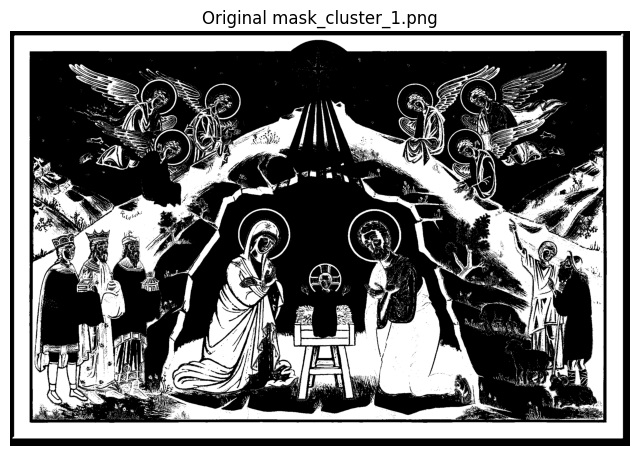

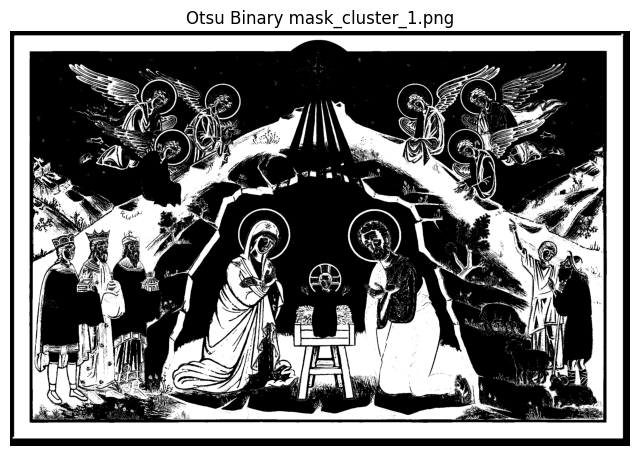

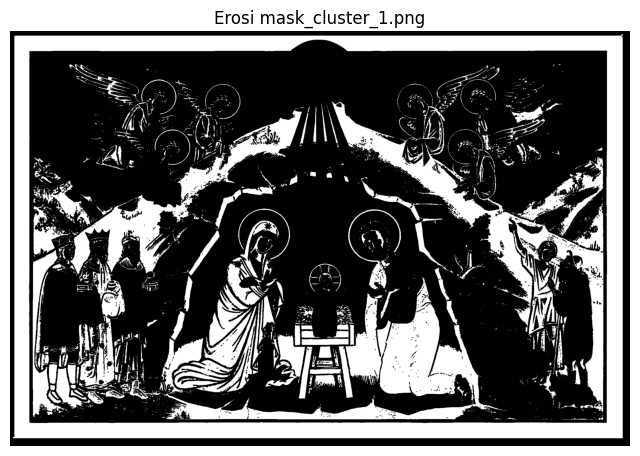

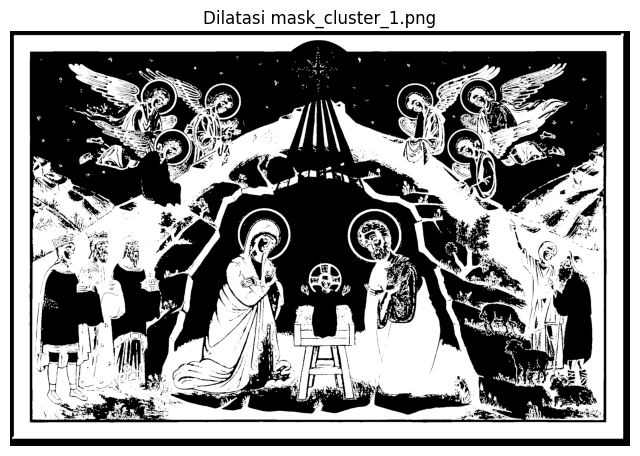

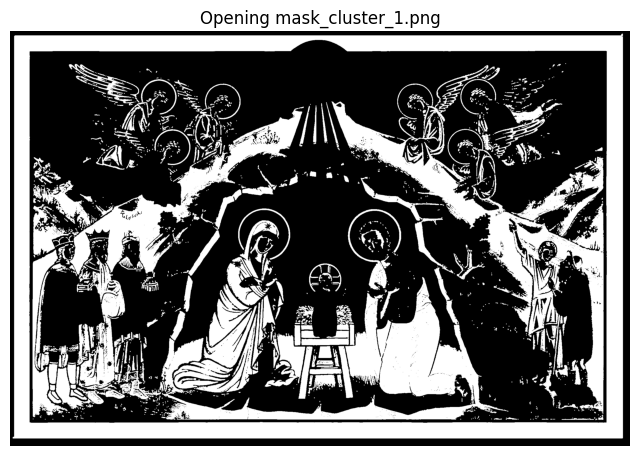

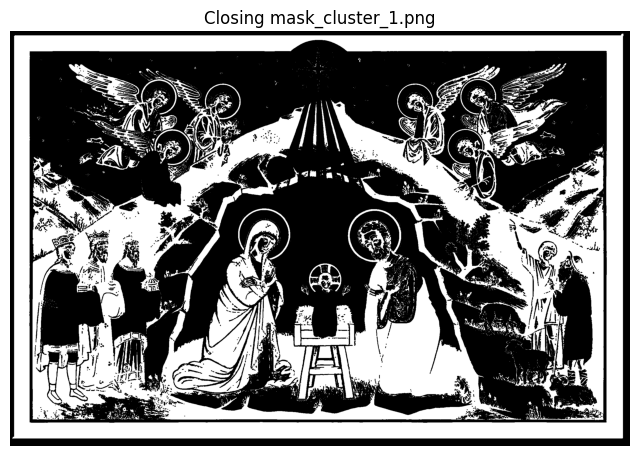

memproses file mask_cluster_2.png
Threshold Otsu terpilih : 0


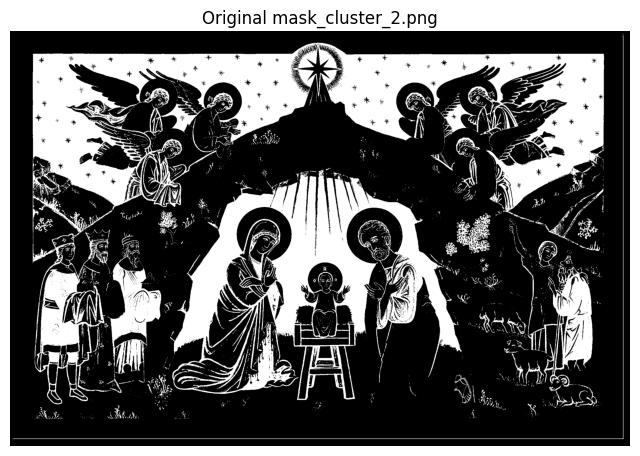

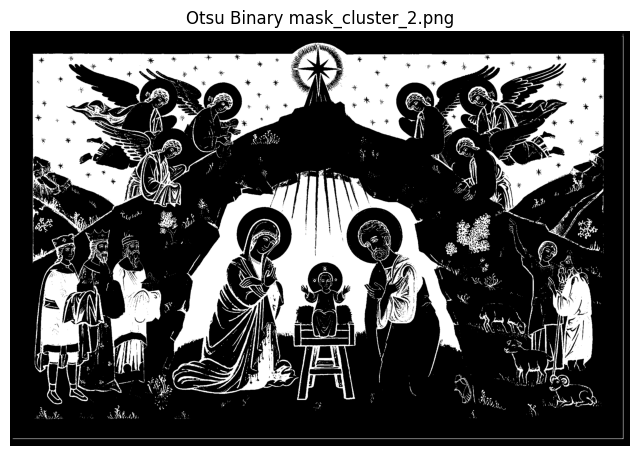

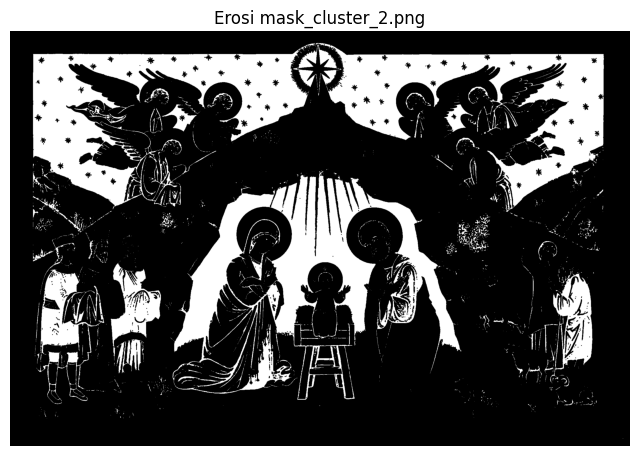

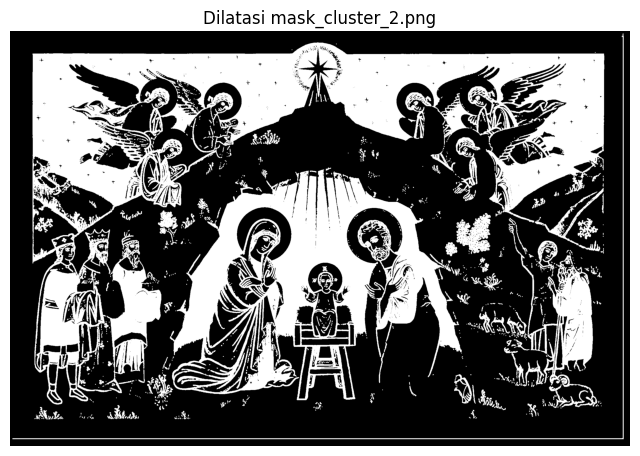

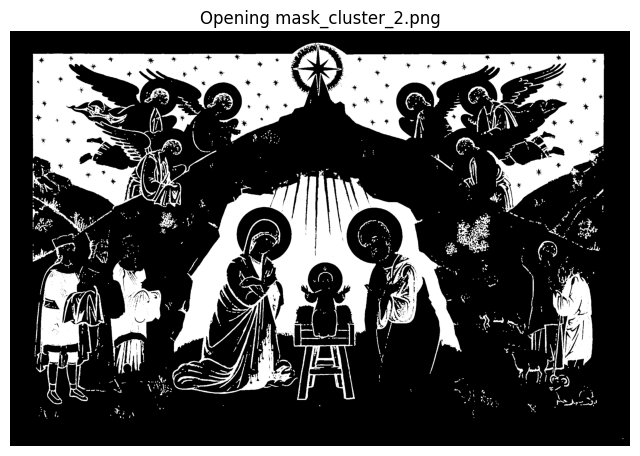

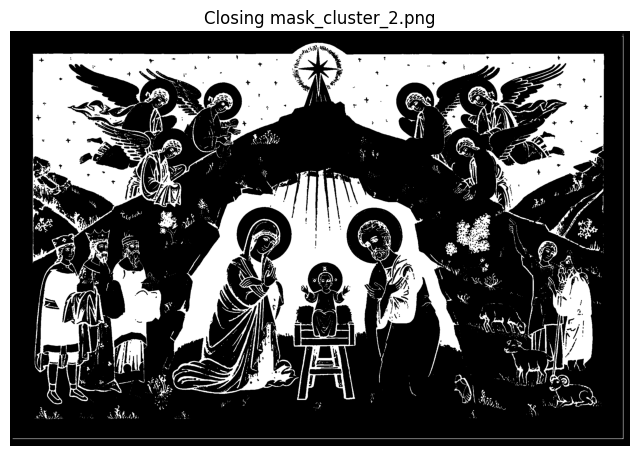

memproses file mask_cluster_3.png
Threshold Otsu terpilih : 0


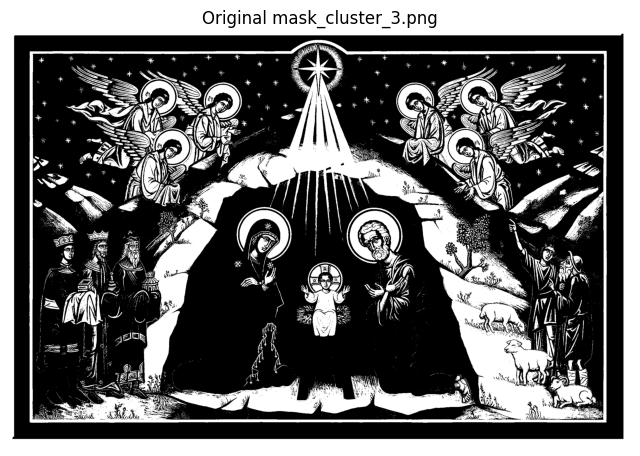

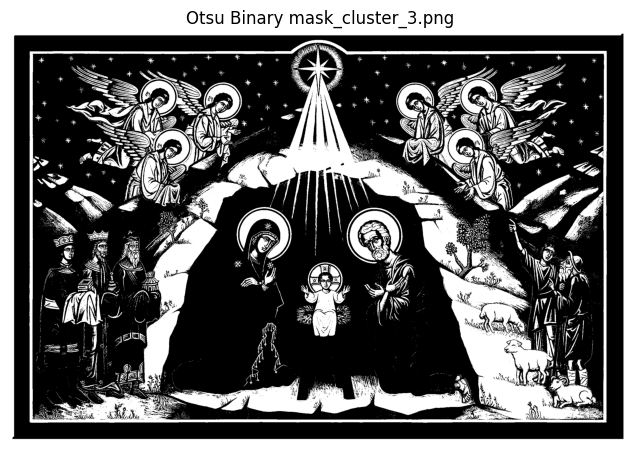

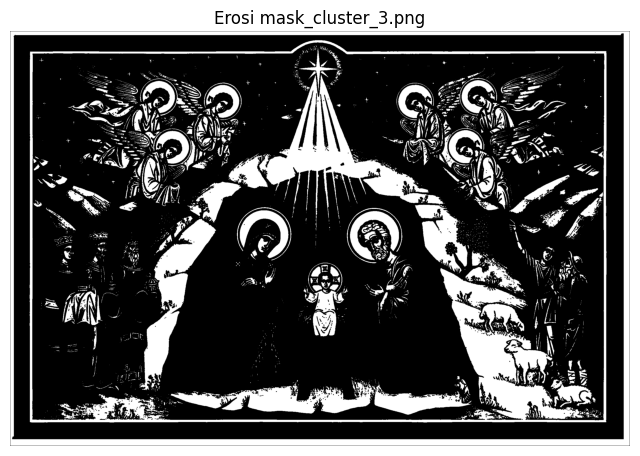

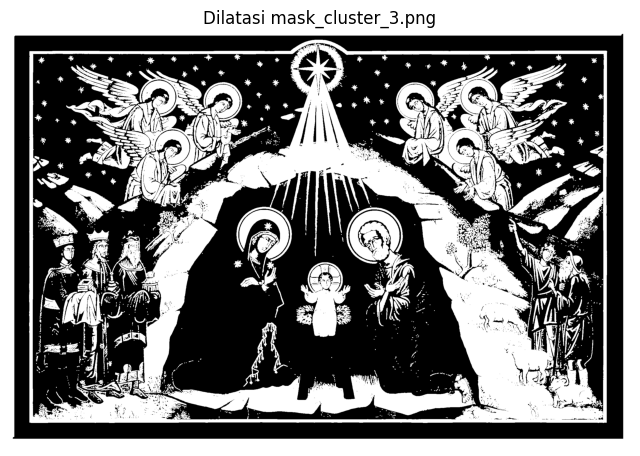

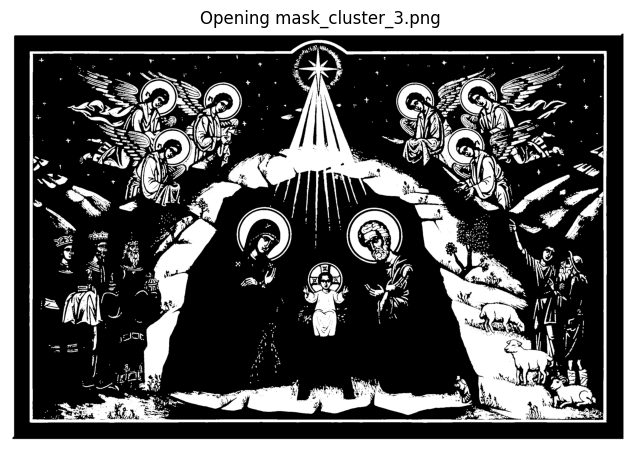

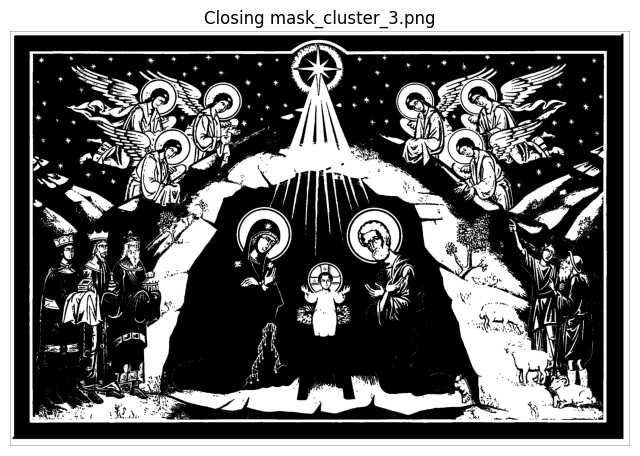

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob


#fungsi manual dari Otsu Thresholding
def otsu_threshold(img):
  hist, bins = np.histogram(img.flatten(), 256, [0, 256])
  total = img.size
  sum_total = np.dot(np.arange(256), hist)

  sumB = 0
  wB = 0
  max_var = 0
  threshold = 0

  for t in range(256):
    wB += hist[t]
    if wB == 0:
      continue
    wF = total - wB
    if wF == 0:
      break
    sumB += t * hist[t]
    mB = sumB / wB
    mF = (sum_total - sumB) / wF
    var_between = wB * wF * (mB - mF) ** 2
    if var_between > max_var :
      max_var = var_between
      threshold = t

  print("Threshold Otsu terpilih : " + str(threshold))
  return (img > threshold).astype(np.uint8)

#fungsi padding untuk image
def padding(img, pad) :
  return np.pad(img, pad, mode='constant', constant_values=0)

#implementasi operasi morfologi
def erosi(img, kernel) :
  k_center = (kernel.shape[0] // 2, kernel.shape[1] // 2)
  padded = padding(img, k_center)
  h, w = img.shape
  kh, kw = kernel.shape
  result = np.zeros_like(img)
  for i in range(h) :
    for j in range(w) :
      region = padded[i:i+kh, j:j+kw]
      if np.all(region[kernel == 1] == 1) :
        result[i, j] = 1
  return result

def dilatasi(img, kernel):
  k_center = (kernel.shape[0] // 2, kernel.shape[1] // 2)
  padded = padding(img, k_center)
  h, w = img.shape
  kh, kw = kernel.shape
  result = np.zeros_like(img)
  for i in range(h):
    for j in range(w):
      region = padded[i:i+kh, j:j+kw]
      if np.any(region[kernel == 1] == 1):
        result[i, j] = 1
  return result


def opening(img, kernel):
  eroded = erosi(img, kernel)
  opened = dilatasi(eroded, kernel)
  return opened

def closing(img, kernel):
  dilated = dilatasi(img, kernel)
  closed = erosi(dilated, kernel)
  return closed

#kernel
kernel = np.ones((3, 3), dtype=np.uint8)

#looping ke semua file mask
mask_files = sorted(glob.glob("mask_cluster_*.png"))

for mask_file in mask_files:
  #load mask
  print("memproses file " + mask_file)

  #baca mask dalam grayscale
  mask = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE)
  #Otsu threshold
  mask_bin = otsu_threshold(mask)

  #operasi morfologi
  eroded = erosi(mask_bin, kernel)
  dilated = dilatasi(mask_bin, kernel)
  opened = opening(mask_bin, kernel)
  closed = closing(mask_bin, kernel)

  #tampilkan hasil
  hasil = {
      "Original" : mask,
      "Otsu Binary" : mask_bin * 255,
      "Erosi" : eroded * 255,
      "Dilatasi" : dilated * 255,
      "Opening" : opened * 255,
      "Closing" : closed * 255
  }

  for title, img in hasil.items():
    plt.figure(figsize=(8, 8))
    plt.imshow(img, cmap='gray')
    plt.title(str(title) + " " + str(mask_file) )
    plt.axis('off')
    plt.show()

memproses file mask_cluster_1.png
Threshold Otsu terpilih : 0


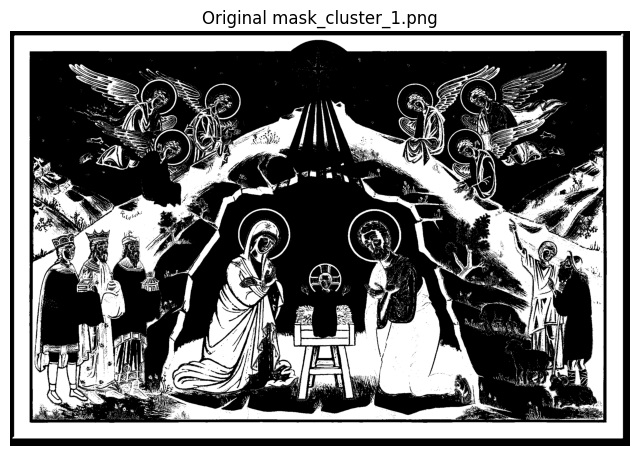

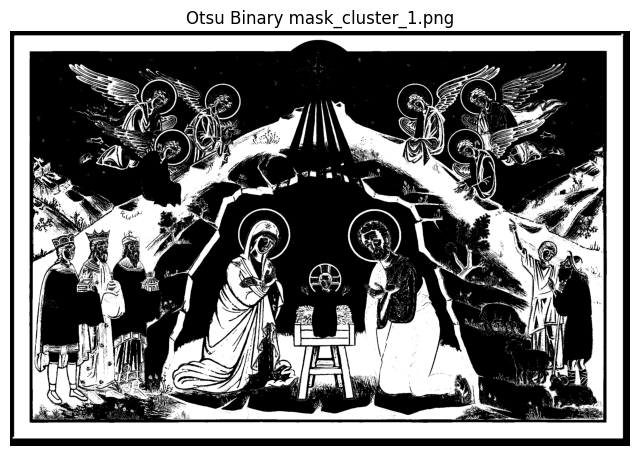

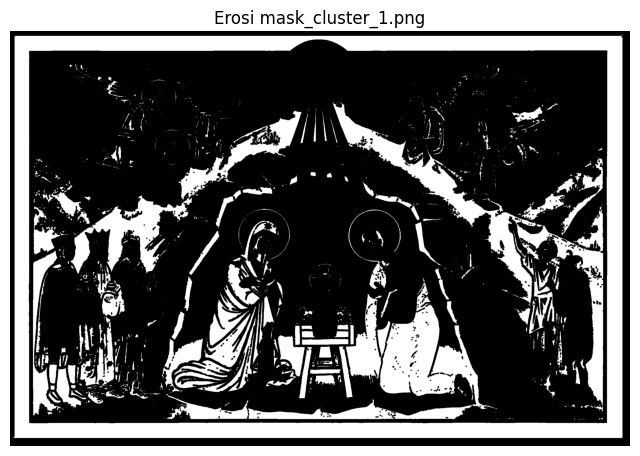

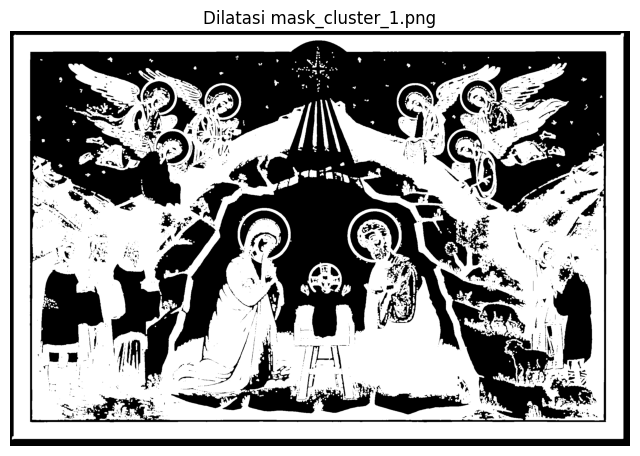

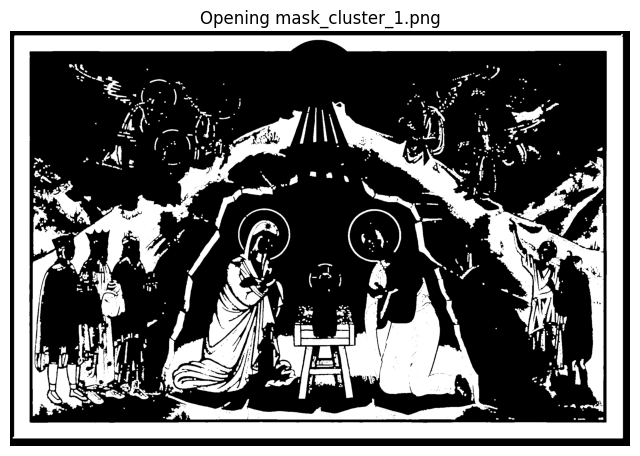

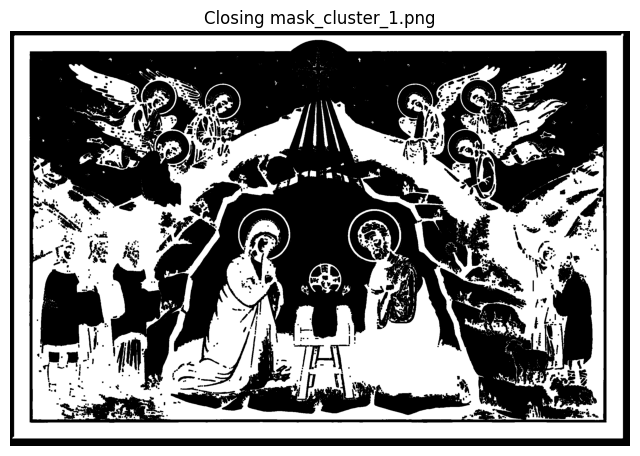

memproses file mask_cluster_2.png
Threshold Otsu terpilih : 0


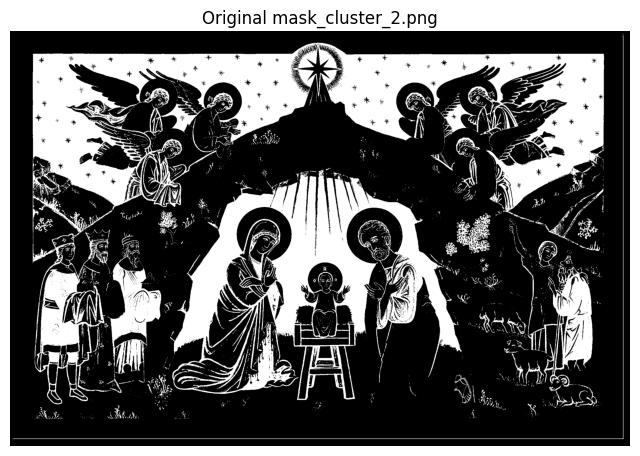

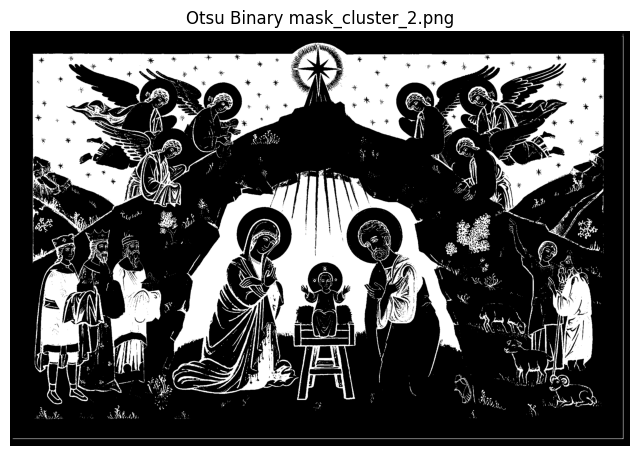

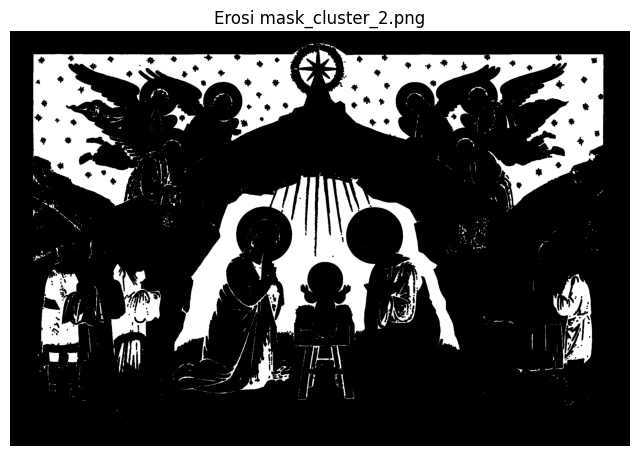

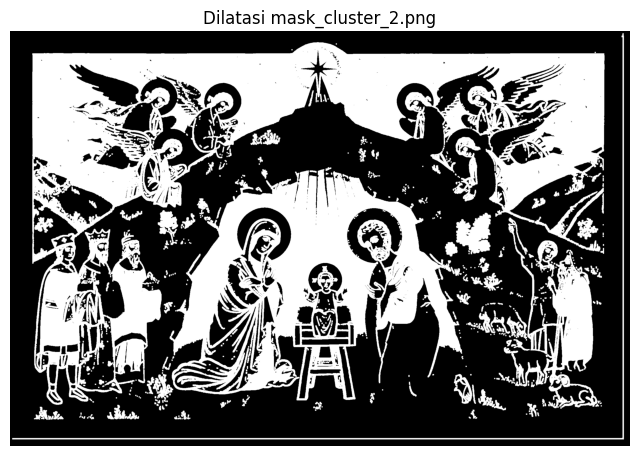

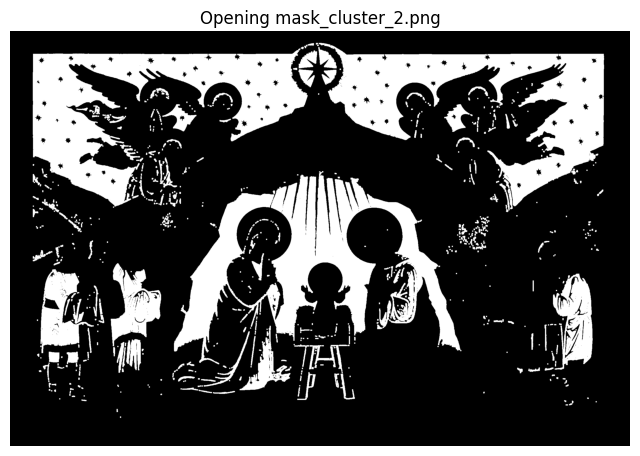

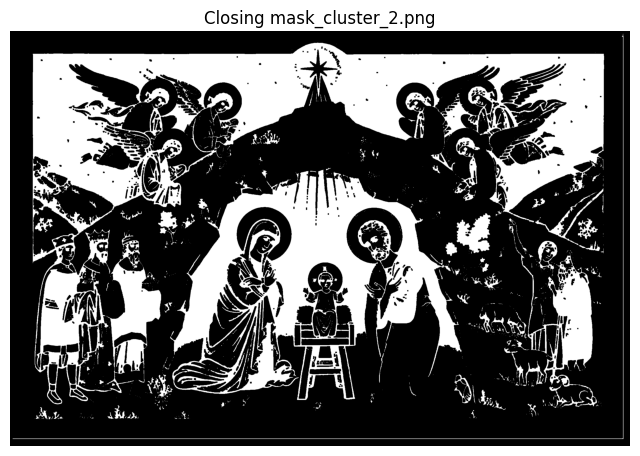

memproses file mask_cluster_3.png
Threshold Otsu terpilih : 0


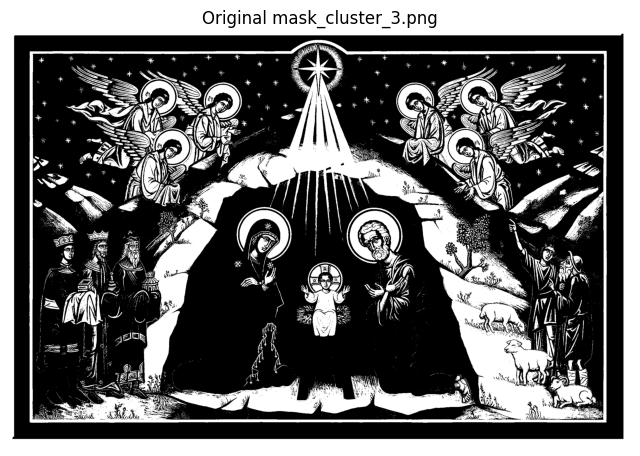

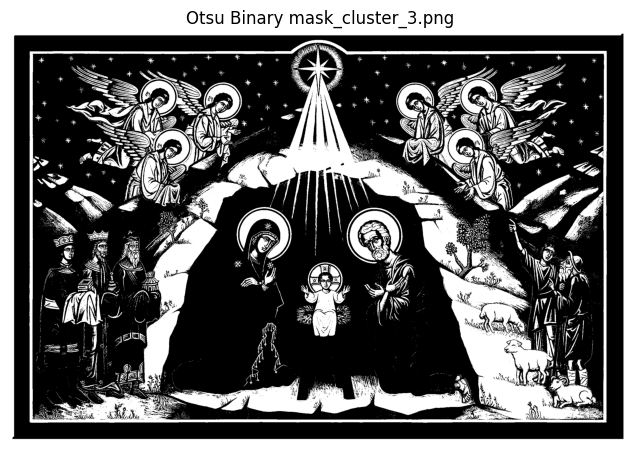

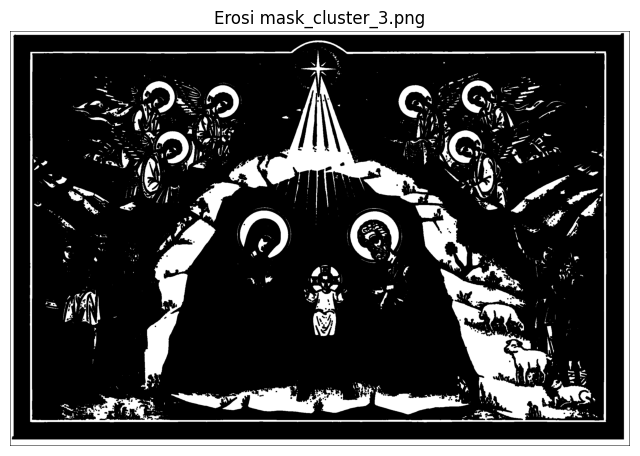

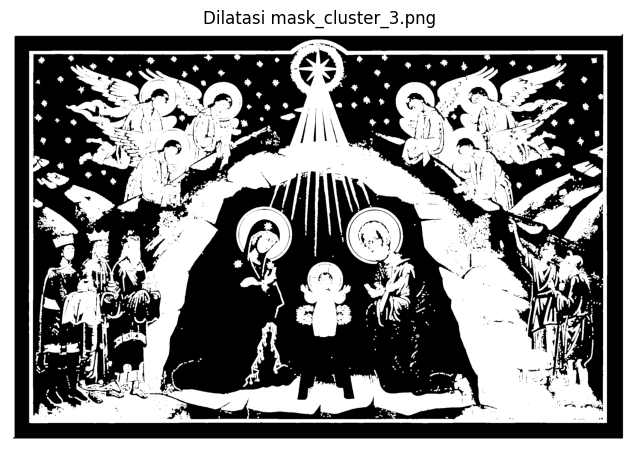

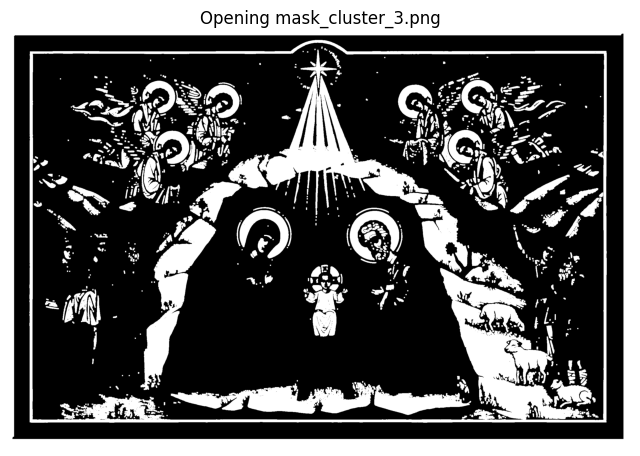

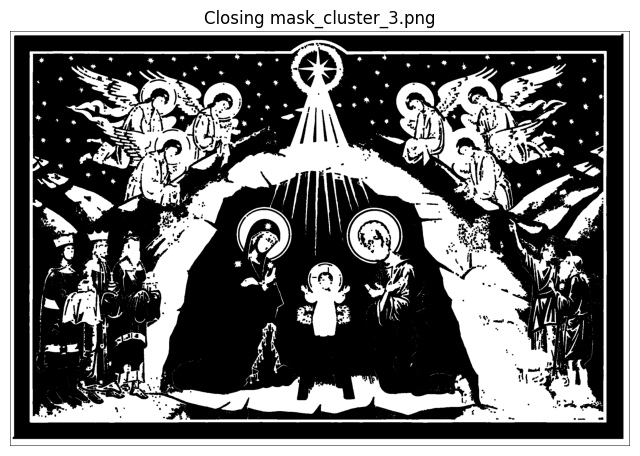

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob


#fungsi manual dari Otsu Thresholding
def otsu_threshold(img):
  hist, bins = np.histogram(img.flatten(), 256, [0, 256])
  total = img.size
  sum_total = np.dot(np.arange(256), hist)

  sumB = 0
  wB = 0
  max_var = 0
  threshold = 0

  for t in range(256):
    wB += hist[t]
    if wB == 0:
      continue
    wF = total - wB
    if wF == 0:
      break
    sumB += t * hist[t]
    mB = sumB / wB
    mF = (sum_total - sumB) / wF
    var_between = wB * wF * (mB - mF) ** 2
    if var_between > max_var :
      max_var = var_between
      threshold = t

  print("Threshold Otsu terpilih : " + str(threshold))
  return (img > threshold).astype(np.uint8)

#fungsi padding untuk image
def padding(img, pad) :
  return np.pad(img, pad, mode='constant', constant_values=0)

#implementasi operasi morfologi
def erosi(img, kernel) :
  k_center = (kernel.shape[0] // 2, kernel.shape[1] // 2)
  padded = padding(img, k_center)
  h, w = img.shape
  kh, kw = kernel.shape
  result = np.zeros_like(img)
  for i in range(h) :
    for j in range(w) :
      region = padded[i:i+kh, j:j+kw]
      if np.all(region[kernel == 1] == 1) :
        result[i, j] = 1
  return result

def dilatasi(img, kernel):
  k_center = (kernel.shape[0] // 2, kernel.shape[1] // 2)
  padded = padding(img, k_center)
  h, w = img.shape
  kh, kw = kernel.shape
  result = np.zeros_like(img)
  for i in range(h):
    for j in range(w):
      region = padded[i:i+kh, j:j+kw]
      if np.any(region[kernel == 1] == 1):
        result[i, j] = 1
  return result


def opening(img, kernel):
  eroded = erosi(img, kernel)
  opened = dilatasi(eroded, kernel)
  return opened

def closing(img, kernel):
  dilated = dilatasi(img, kernel)
  closed = erosi(dilated, kernel)
  return closed

#kernel
kernel = np.ones((5, 5), dtype=np.uint8)

#looping ke semua file mask
mask_files = sorted(glob.glob("mask_cluster_*.png"))

for mask_file in mask_files:
  #load mask
  print("memproses file " + mask_file)

  #baca mask dalam grayscale
  mask = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE)
  #Otsu threshold
  mask_bin = otsu_threshold(mask)

  #operasi morfologi
  eroded = erosi(mask_bin, kernel)
  dilated = dilatasi(mask_bin, kernel)
  opened = opening(mask_bin, kernel)
  closed = closing(mask_bin, kernel)

  #tampilkan hasil
  hasil = {
      "Original" : mask,
      "Otsu Binary" : mask_bin * 255,
      "Erosi" : eroded * 255,
      "Dilatasi" : dilated * 255,
      "Opening" : opened * 255,
      "Closing" : closed * 255
  }

  for title, img in hasil.items():
    plt.figure(figsize=(8, 8))
    plt.imshow(img, cmap='gray')
    plt.title(str(title) + " " + str(mask_file) )
    plt.axis('off')
    plt.show()